In [16]:
%load_ext autoreload
%autoreload 2

import scanpy as sc
import matplotlib.pyplot as plt
import umap
import pandas as pd
import seaborn as sns
import numpy as np

from data_loader import load_xenium_breast_cancer

from famo.core import CORE
from famo.utils_io import load_model
from famo.utils_downstream import match
from famo.plotting import plot_training_curve, plot_variance_explained, plot_factor_correlation, plot_factors_scatter

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [17]:
data = load_xenium_breast_cancer()

In [20]:
data

{'group_visium': {'rna': AnnData object with n_obs × n_vars = 4992 × 18085
      obs: 'array_row', 'array_col', 'cluster', 'celltype'
      var: 'symbol'
      uns: 'log1p', 'spatial'
      obsm: 'spatial'
      layers: 'counts'},
 'group_xenium': {'rna': AnnData object with n_obs × n_vars = 167780 × 313
      obs: 'celltype', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area'
      var: 'symbol'
      uns: 'log1p'
      obsm: 'spatial'
      layers: 'counts'},
 'group_chromium': {'rna': AnnData object with n_obs × n_vars = 30365 × 18082
      obs: 'celltype'
      var: 'symbol'
      uns: 'log1p'
      layers: 'counts'}}

## Chromium Only

In [18]:
adata_chromium = data['group_chromium']['rna'].copy()
sc.pp.highly_variable_genes(adata_chromium, n_top_genes=3000, subset=True)

# prismo_model_chromium = CORE(device="cuda:0")
# prismo_model_chromium.fit(
#     data=adata_chromium,
#     n_factors=10,
#     weight_prior="Horseshoe",
#     factor_prior="Normal",
#     likelihoods="Normal",
#     early_stopper_patience=300,
#     lr=5e-3,
#     plot_data_overview=False,
#     save_path="results/prismo_chromium",
#     seed=5432,
#     init_factors="pca",
# )

prismo_model_chromium = load_model("results/prismo_chromium")

Model loaded from results/prismo_chromium/model.pkl
Parameters loaded from results/prismo_chromium/params.save


In [4]:
plot_training_curve(prismo_model_chromium)

alt.Chart(...)

In [5]:
plot_variance_explained(prismo_model_chromium)

alt.HConcatChart(...)

In [6]:
plot_factor_correlation(prismo_model_chromium)

alt.HConcatChart(...)

In [7]:
z_chromium = prismo_model_chromium.get_factors("numpy")['group_1']

In [8]:
z_chromium_umap = umap.UMAP().fit_transform(z_chromium)

/tmp/ipykernel_109612/1955075856.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(z_chromium_umap[inds, 0], z_chromium_umap[inds, 1], c=plt.get_cmap("tab20")(i), s=.1, label=celltype)


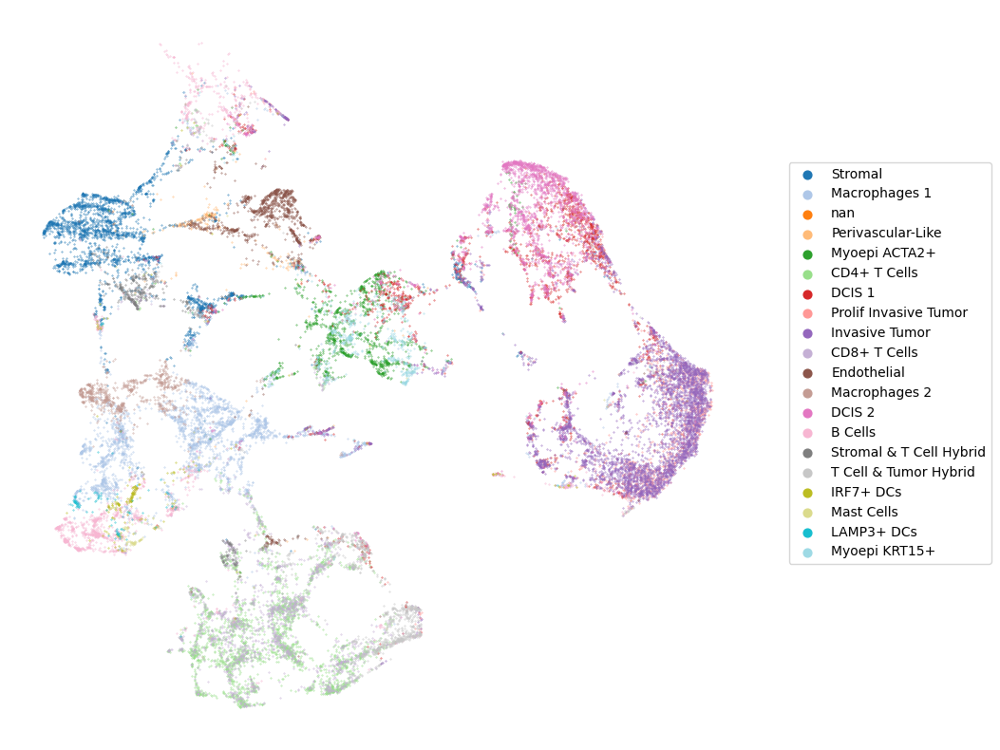

In [9]:
celltypes = prismo_model_chromium.data['group_1']['view_1'].obs['celltype']

fig, ax = plt.subplots(figsize=(10, 10))
for i, celltype in enumerate(celltypes.unique()):
    inds = celltypes == celltype
    ax.scatter(z_chromium_umap[inds, 0], z_chromium_umap[inds, 1], c=plt.get_cmap("tab20")(i), s=.1, label=celltype)
ax.legend(markerscale=20, bbox_to_anchor=(1.05, 0.8))
ax.axis("off")
plt.show()

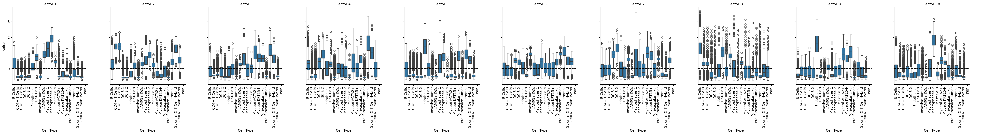

In [10]:
z_df = pd.DataFrame(z_chromium)
z_df.columns = [f"Factor {i+1}" for i in range(z_df.shape[1])]
z_df["celltype"] = prismo_model_chromium.data['group_1']['view_1'].obs['celltype'].values

z_df_long = z_df.melt(id_vars='celltype', var_name='Category', value_name='Value')

sorted_celltypes = sorted(z_df_long['celltype'].astype(str).unique())

# Create the Seaborn boxplot with facet
g = sns.catplot(
    data=z_df_long,
    x='celltype',
    y='Value',
    col='Category',
    kind='box',
    col_wrap=10,  # Adjust this to control the number of columns in the grid
    height=4,
    aspect=0.99,
    order=sorted_celltypes  # Sort the x-axis categories alphabetically
)

def add_hline(*args, **kwargs):
    plt.axhline(y=0, color='black', linestyle='--')

g.map(add_hline)

g.set_xticklabels(rotation=90)
g.set_titles("{col_name}")
g.set_axis_labels("Cell Type", "Value")
plt.show()

## Visium Only

In [19]:
adata_visium = data['group_visium']['rna'].copy()
sc.pp.highly_variable_genes(adata_visium, n_top_genes=3000, subset=True)

# prismo_model_visium = CORE(device="cuda:0")
# prismo_model_visium.fit(
#     data=adata_visium,
#     n_factors=10,
#     weight_prior="Horseshoe",
#     factor_prior="GP",
#     likelihoods="Normal",
#     covariates_obsm_key="spatial",
#     early_stopper_patience=300,
#     lr=5e-3,
#     plot_data_overview=False,
#     save_path="results/prismo_visium",
#     seed=5432,
#     init_factors="pca",
#     gp_n_inducing=2000,
# )

prismo_model_visium = load_model("results/prismo_visium")

Model loaded from results/prismo_visium/model.pkl
Parameters loaded from results/prismo_visium/params.save


In [13]:
plot_training_curve(prismo_model_visium)

alt.Chart(...)

In [14]:
plot_variance_explained(prismo_model_visium)

alt.HConcatChart(...)

In [15]:
plot_factor_correlation(prismo_model_visium)

alt.HConcatChart(...)

In [16]:
z_visium = prismo_model_visium.get_factors("numpy")['group_1']

In [17]:
z_visium_umap = umap.UMAP().fit_transform(z_visium)

/tmp/ipykernel_109612/3318265710.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(z_visium_umap[inds, 0], z_visium_umap[inds, 1], c=plt.get_cmap("tab20")(i), s=.1, label=celltype)


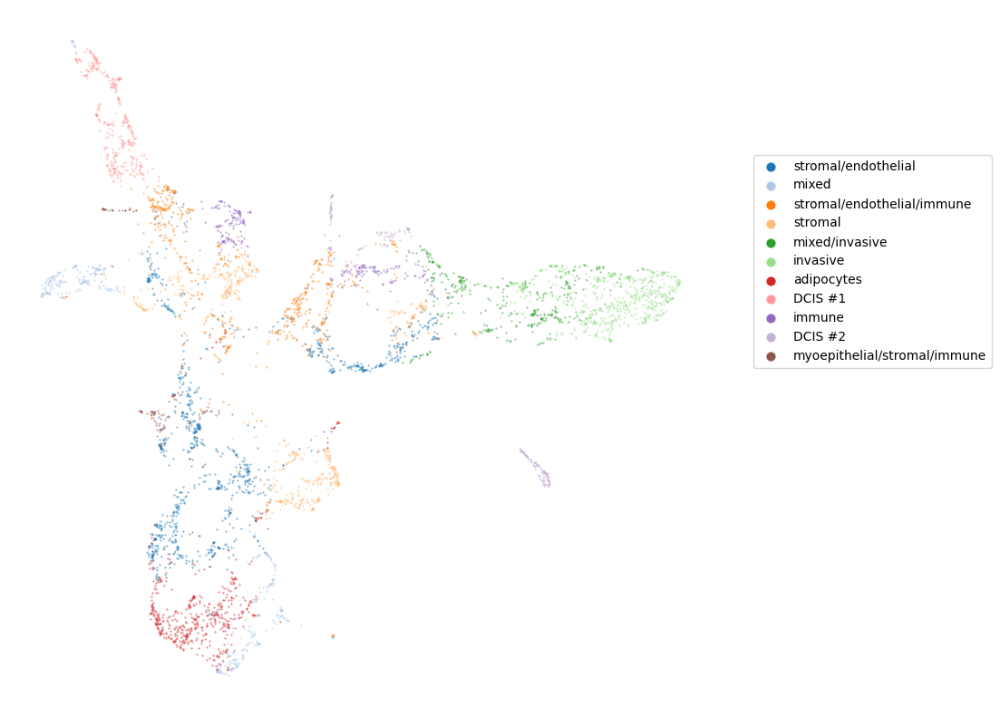

In [18]:
celltypes = prismo_model_visium.data['group_1']['view_1'].obs['celltype']

fig, ax = plt.subplots(figsize=(10, 10))
for i, celltype in enumerate(celltypes.unique()):
    inds = celltypes == celltype
    ax.scatter(z_visium_umap[inds, 0], z_visium_umap[inds, 1], c=plt.get_cmap("tab20")(i), s=.1, label=celltype)
ax.legend(markerscale=20, bbox_to_anchor=(1.05, 0.8))
ax.axis("off")
plt.show()

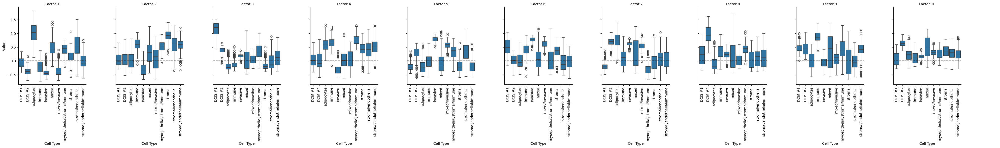

In [19]:
z_df = pd.DataFrame(z_visium)
z_df.columns = [f"Factor {i+1}" for i in range(z_df.shape[1])]
z_df["celltype"] = prismo_model_visium.data['group_1']['view_1'].obs['celltype'].values

z_df_long = z_df.melt(id_vars='celltype', var_name='Category', value_name='Value')

sorted_celltypes = sorted(z_df_long['celltype'].astype(str).unique())

# Create the Seaborn boxplot with facet
g = sns.catplot(
    data=z_df_long,
    x='celltype',
    y='Value',
    col='Category',
    kind='box',
    col_wrap=10,  # Adjust this to control the number of columns in the grid
    height=4,
    aspect=0.99,
    order=sorted_celltypes  # Sort the x-axis categories alphabetically
)

def add_hline(*args, **kwargs):
    plt.axhline(y=0, color='black', linestyle='--')

g.map(add_hline)

g.set_xticklabels(rotation=90)
g.set_titles("{col_name}")
g.set_axis_labels("Cell Type", "Value")
plt.show()

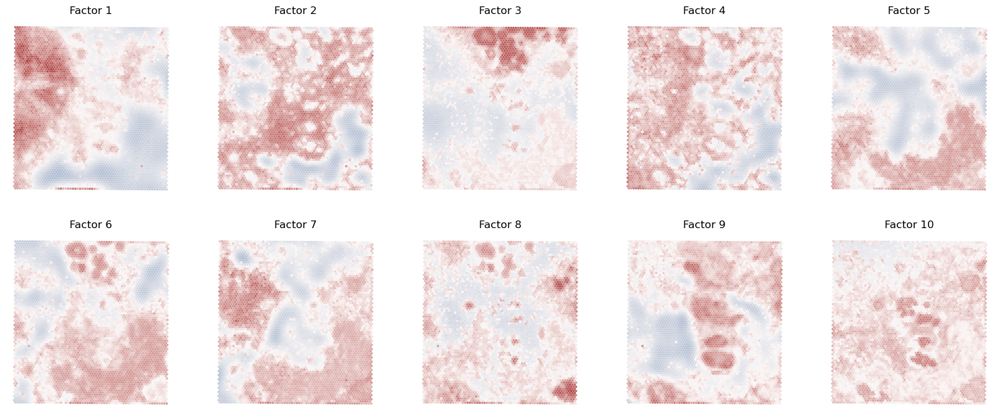

In [20]:
fig, axs = plt.subplots(2, prismo_model_visium.n_factors // 2, figsize=(20, 8))

vmax = np.abs(z_visium.max())

for i in range(prismo_model_visium.n_factors):
    ax = axs.flatten()[i]
    ax.scatter(prismo_model_visium.covariates["group_1"][:, 0], prismo_model_visium.covariates["group_1"][:, 1], c=z_visium[:, i], s=3, cmap="vlag", vmax=vmax, vmin=-vmax)
    ax.axis("off")
    ax.set_aspect(1.)
    ax.set_title(f"Factor {i+1}")

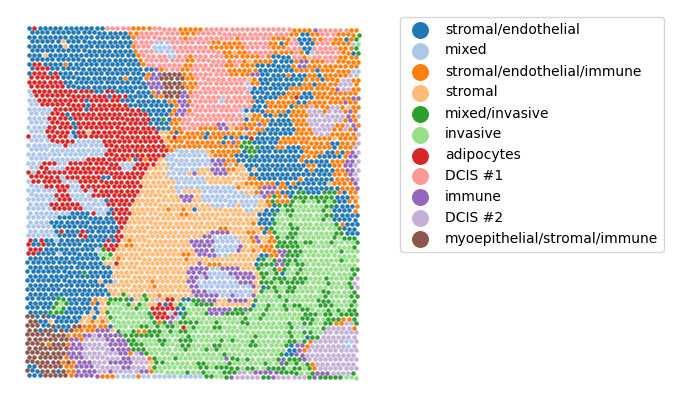

In [21]:
fig, ax = plt.subplots(figsize=(5, 5))

celltypes = prismo_model_visium.data['group_1']['view_1'].obs['celltype']
x = prismo_model_visium.covariates["group_1"][:, 0].numpy()
y = prismo_model_visium.covariates["group_1"][:, 1].numpy()

for i, celltype in enumerate(celltypes.unique()):
    inds = celltypes == celltype
    ax.scatter(x[inds], y[inds], s=5, color=plt.get_cmap("tab20")(i), label=celltype)
ax.legend(markerscale=5, bbox_to_anchor=(1.05, 1.0))
ax.axis("off")
ax.set_aspect(1.)

## Xenium Only

In [23]:
adata_xenium = data['group_xenium']['rna'].copy()

# prismo_model_xenium = CORE(device="cuda:1")
# prismo_model_xenium.fit(
#     data=adata_xenium,
#     n_factors=10,
#     weight_prior="Horseshoe",
#     factor_prior="GP",
#     likelihoods="Normal",
#     covariates_obsm_key="spatial",
#     early_stopper_patience=100,
#     lr=1e-2,
#     plot_data_overview=False,
#     save_path="results/prismo_xenium",
#     seed=5432,
#     gp_n_inducing=1500,
#     init_factors="pca",
#     batch_size=5000,
#     print_every=10,
# )

prismo_model_xenium = load_model("results/prismo_xenium")

Model loaded from results/prismo_xenium/model.pkl
Parameters loaded from results/prismo_xenium/params.save


In [4]:
plot_training_curve(prismo_model_xenium)

alt.Chart(...)

In [5]:
plot_variance_explained(prismo_model_xenium)

alt.HConcatChart(...)

In [6]:
plot_factor_correlation(prismo_model_xenium)

alt.HConcatChart(...)

In [7]:
z_xenium = prismo_model_xenium.get_factors("numpy")['group_1']

In [8]:
z_xenium_umap = umap.UMAP().fit_transform(z_xenium)

/tmp/ipykernel_112002/2812636436.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(z_xenium_umap[inds, 0], z_xenium_umap[inds, 1], c=plt.get_cmap("tab20")(i), s=.1, label=celltype)


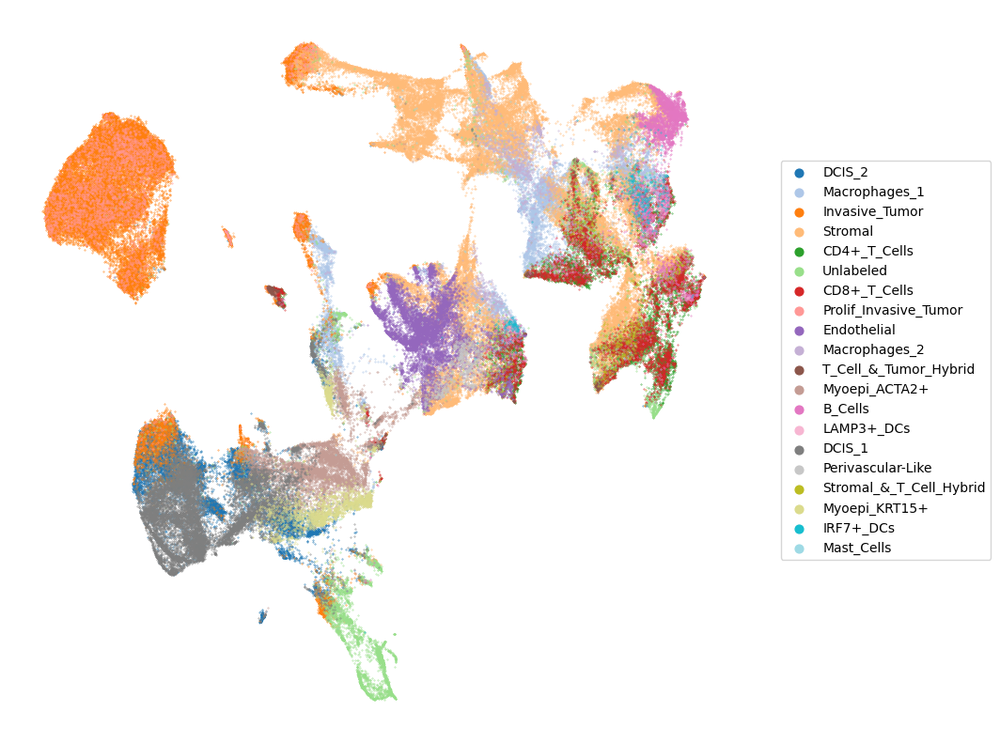

In [9]:
celltypes = prismo_model_xenium.data['group_1']['view_1'].obs['celltype']

fig, ax = plt.subplots(figsize=(10, 10))
for i, celltype in enumerate(celltypes.unique()):
    inds = celltypes == celltype
    ax.scatter(z_xenium_umap[inds, 0], z_xenium_umap[inds, 1], c=plt.get_cmap("tab20")(i), s=.1, label=celltype)
ax.legend(markerscale=20, bbox_to_anchor=(1.05, 0.8))
ax.axis("off")
plt.show()

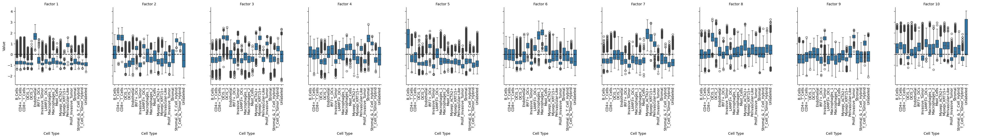

In [10]:
z_df = pd.DataFrame(z_xenium)
z_df.columns = [f"Factor {i+1}" for i in range(z_df.shape[1])]
z_df["celltype"] = prismo_model_xenium.data['group_1']['view_1'].obs['celltype'].values

z_df_long = z_df.melt(id_vars='celltype', var_name='Category', value_name='Value')

sorted_celltypes = sorted(z_df_long['celltype'].astype(str).unique())

# Create the Seaborn boxplot with facet
g = sns.catplot(
    data=z_df_long,
    x='celltype',
    y='Value',
    col='Category',
    kind='box',
    col_wrap=10,  # Adjust this to control the number of columns in the grid
    height=4,
    aspect=0.99,
    order=sorted_celltypes  # Sort the x-axis categories alphabetically
)

def add_hline(*args, **kwargs):
    plt.axhline(y=0, color='black', linestyle='--')

g.map(add_hline)

g.set_xticklabels(rotation=90)
g.set_titles("{col_name}")
g.set_axis_labels("Cell Type", "Value")
plt.show()

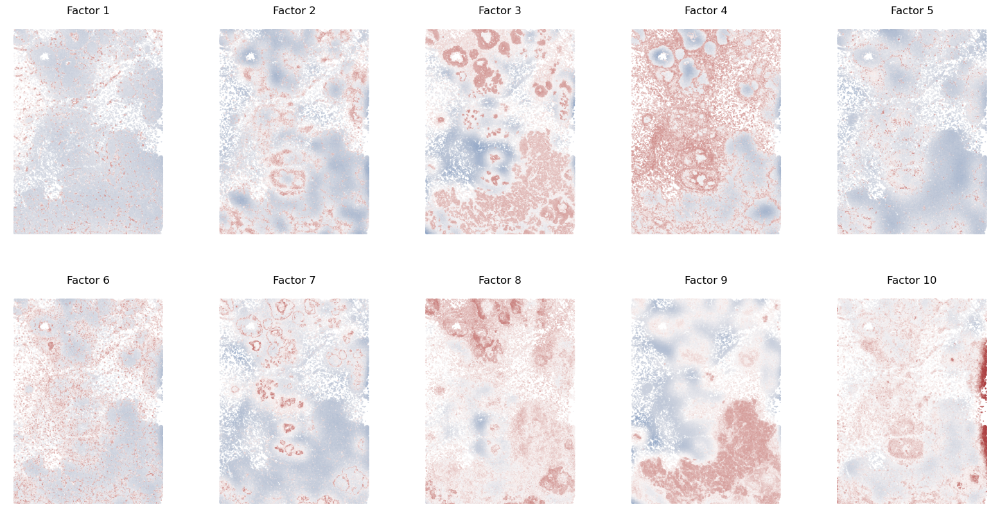

In [11]:
fig, axs = plt.subplots(2, prismo_model_xenium.n_factors // 2, figsize=(20, 10))

vmax = np.abs(z_xenium.max())

for i in range(prismo_model_xenium.n_factors):
    ax = axs.flatten()[i]
    ax.scatter(-1 * prismo_model_xenium.covariates["group_1"][:, 1], prismo_model_xenium.covariates["group_1"][:, 0], c=z_xenium[:, i], s=0.1, cmap="vlag", vmax=vmax, vmin=-vmax)
    ax.axis("off")
    ax.set_aspect(1.)
    ax.set_title(f"Factor {i+1}")

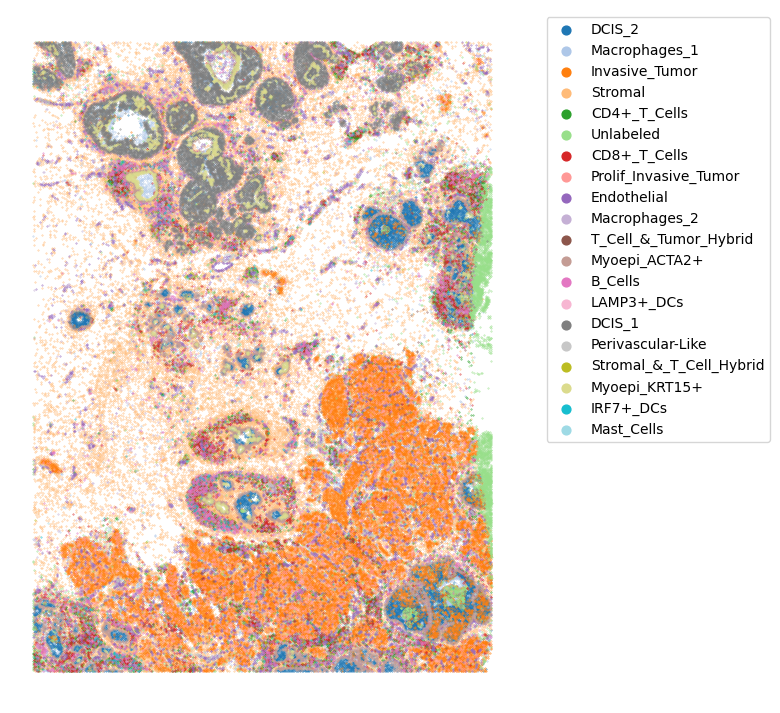

In [19]:
fig, ax = plt.subplots(figsize=(9, 9))

celltypes = prismo_model_xenium.data['group_1']['view_1'].obs['celltype']
x = -1 * prismo_model_xenium.covariates["group_1"][:, 1].numpy()
y = prismo_model_xenium.covariates["group_1"][:, 0].numpy()

for i, celltype in enumerate(celltypes.unique()):
    inds = celltypes == celltype
    ax.scatter(x[inds], y[inds], s=0.1, color=plt.get_cmap("tab20")(i), label=celltype)
ax.legend(markerscale=20, bbox_to_anchor=(1.05, 1.0))
ax.axis("off")
ax.set_aspect(1.)

## Xenium + Visium

In [3]:
data_xenium = load_xenium_breast_cancer()["group_xenium"]["rna"].copy()
data_visium = load_xenium_breast_cancer()["group_visium"]["rna"].copy()
sc.pp.highly_variable_genes(data_visium, n_top_genes=3000, subset=True)

data = {"xenium" : {"rna" : data_xenium}, "visium" : {"rna" : data_visium}}

In [4]:
# prismo_model_xenium_visium = CORE(device="cuda:1")
# prismo_model_xenium_visium.fit(
#     data=data,
#     n_factors=10,
#     weight_prior="Horseshoe",
#     factor_prior={"xenium" : "GP", "visium" : "GP"},
#     likelihoods={"rna" : "Normal"},
#     covariates_obsm_key={"xenium" : "spatial", "visium" : "spatial"},
#     early_stopper_patience=50,
#     lr=5e-3,
#     plot_data_overview=False,
#     save_path="results/prismo_xenium_visium",
#     seed=54321,
#     gp_n_inducing=1000,
#     init_factors="pca",
#     batch_size=5000,
#     print_every=1,
# )

prismo_model_xenium_visium = load_model("results/prismo_xenium_visium")

Model loaded from results/prismo_xenium_visium/model.pkl
Parameters loaded from results/prismo_xenium_visium/params.save


In [6]:
plot_training_curve(prismo_model_xenium_visium)

alt.Chart(...)

In [7]:
plot_variance_explained(prismo_model_xenium_visium)

alt.HConcatChart(...)

In [8]:
plot_factor_correlation(prismo_model_xenium_visium)

alt.HConcatChart(...)

In [7]:
z_xenium = prismo_model_xenium_visium.get_factors("numpy")['xenium']
z_visium = prismo_model_xenium_visium.get_factors("numpy")['visium']

In [8]:
z_xenium_umap = umap.UMAP().fit_transform(z_xenium)
z_visium_umap = umap.UMAP().fit_transform(z_visium)

/tmp/ipykernel_122100/4127396752.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(z_xenium_umap[inds, 0], z_xenium_umap[inds, 1], c=plt.get_cmap("tab20")(i), s=.1, label=celltype)


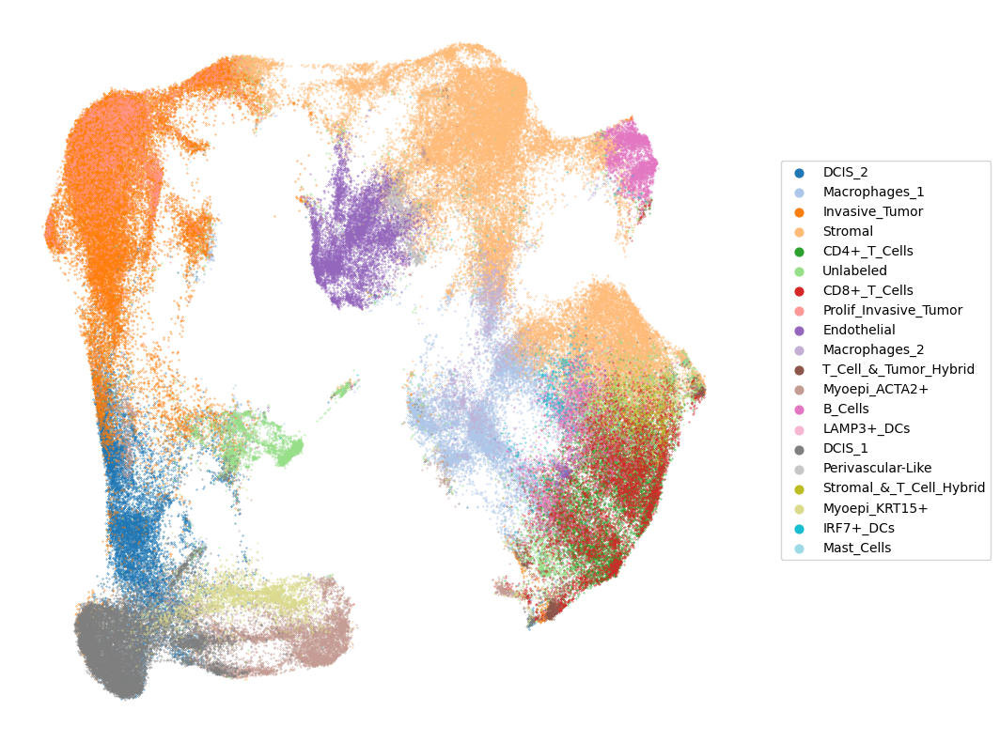

In [9]:
celltypes = prismo_model_xenium_visium.data['xenium']['rna'].obs['celltype']

fig, ax = plt.subplots(figsize=(10, 10))
for i, celltype in enumerate(celltypes.unique()):
    inds = celltypes == celltype
    ax.scatter(z_xenium_umap[inds, 0], z_xenium_umap[inds, 1], c=plt.get_cmap("tab20")(i), s=.1, label=celltype)
ax.legend(markerscale=20, bbox_to_anchor=(1.05, 0.8))
ax.axis("off")
plt.show()

/tmp/ipykernel_122100/1865663036.py:6: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(z_visium_umap[inds, 0], z_visium_umap[inds, 1], c=plt.get_cmap("tab20")(i), s=.1, label=celltype)


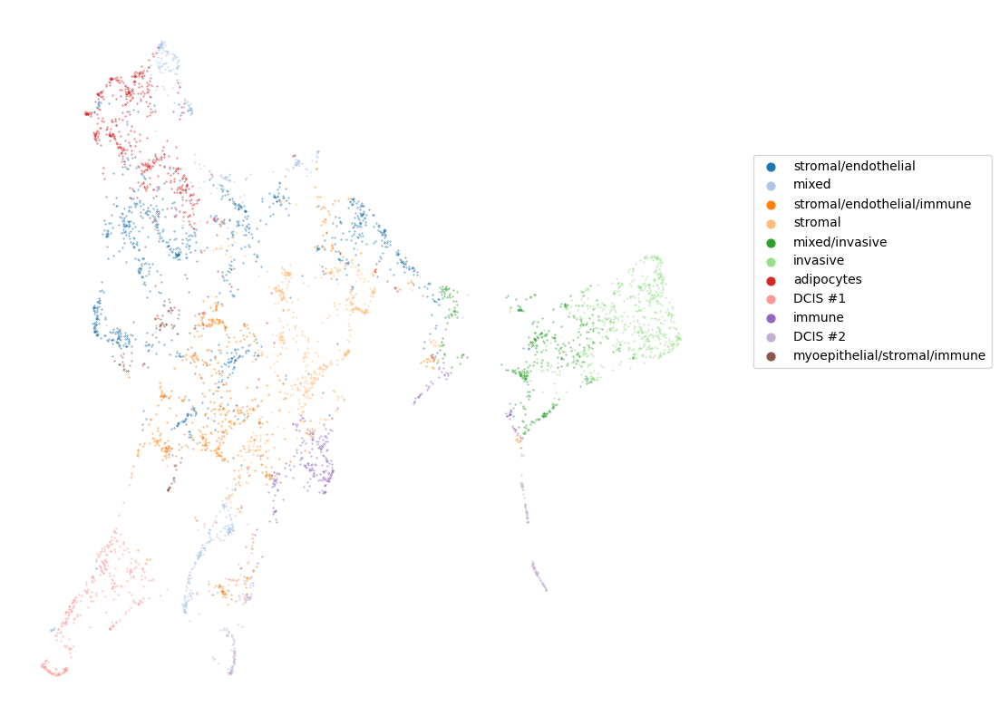

In [10]:
celltypes = prismo_model_xenium_visium.data['visium']['rna'].obs['celltype']

fig, ax = plt.subplots(figsize=(10, 10))
for i, celltype in enumerate(celltypes.unique()):
    inds = celltypes == celltype
    ax.scatter(z_visium_umap[inds, 0], z_visium_umap[inds, 1], c=plt.get_cmap("tab20")(i), s=.1, label=celltype)
ax.legend(markerscale=20, bbox_to_anchor=(1.05, 0.8))
ax.axis("off")
plt.show()

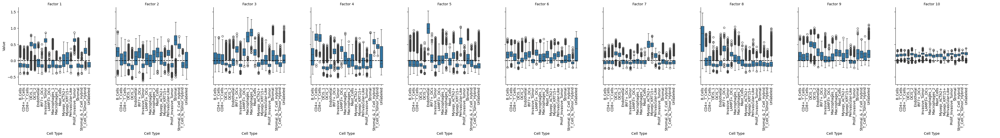

In [11]:
z_df = pd.DataFrame(z_xenium)
z_df.columns = [f"Factor {i+1}" for i in range(z_df.shape[1])]
z_df["celltype"] = prismo_model_xenium_visium.data['xenium']['rna'].obs['celltype'].values

z_df_long = z_df.melt(id_vars='celltype', var_name='Category', value_name='Value')

sorted_celltypes = sorted(z_df_long['celltype'].astype(str).unique())

# Create the Seaborn boxplot with facet
g = sns.catplot(
    data=z_df_long,
    x='celltype',
    y='Value',
    col='Category',
    kind='box',
    col_wrap=10,  # Adjust this to control the number of columns in the grid
    height=4,
    aspect=0.99,
    order=sorted_celltypes  # Sort the x-axis categories alphabetically
)

def add_hline(*args, **kwargs):
    plt.axhline(y=0, color='black', linestyle='--')

g.map(add_hline)

g.set_xticklabels(rotation=90)
g.set_titles("{col_name}")
g.set_axis_labels("Cell Type", "Value")
plt.show()

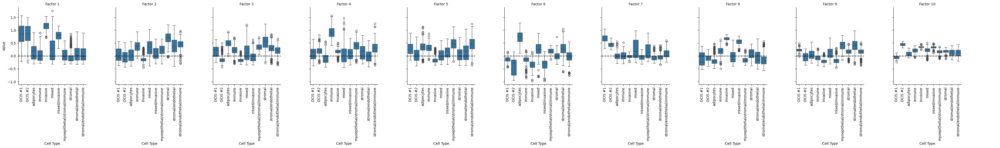

In [12]:
z_df = pd.DataFrame(z_visium)
z_df.columns = [f"Factor {i+1}" for i in range(z_df.shape[1])]
z_df["celltype"] = prismo_model_xenium_visium.data['visium']['rna'].obs['celltype'].values

z_df_long = z_df.melt(id_vars='celltype', var_name='Category', value_name='Value')

sorted_celltypes = sorted(z_df_long['celltype'].astype(str).unique())

# Create the Seaborn boxplot with facet
g = sns.catplot(
    data=z_df_long,
    x='celltype',
    y='Value',
    col='Category',
    kind='box',
    col_wrap=10,  # Adjust this to control the number of columns in the grid
    height=4,
    aspect=0.99,
    order=sorted_celltypes  # Sort the x-axis categories alphabetically
)

def add_hline(*args, **kwargs):
    plt.axhline(y=0, color='black', linestyle='--')

g.map(add_hline)

g.set_xticklabels(rotation=90)
g.set_titles("{col_name}")
g.set_axis_labels("Cell Type", "Value")
plt.show()

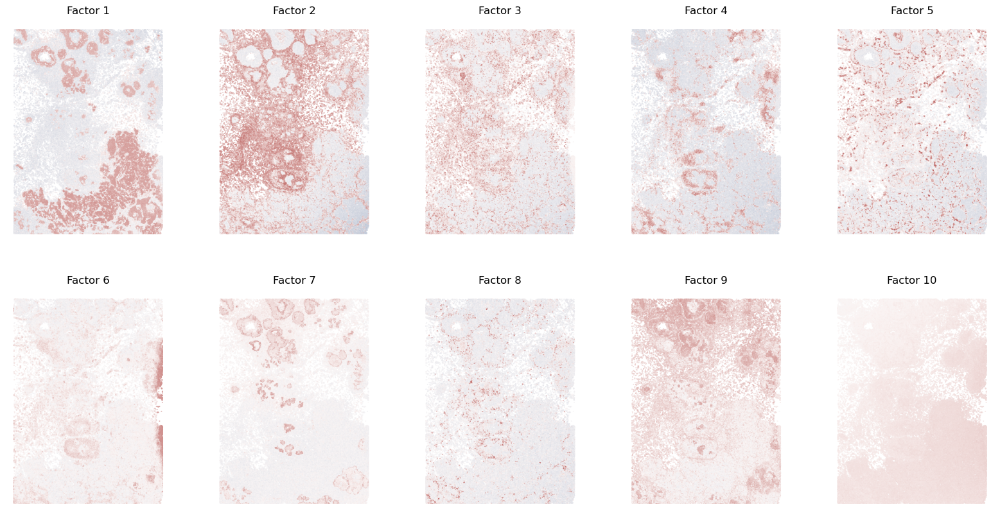

In [14]:
fig, axs = plt.subplots(2, prismo_model_xenium_visium.n_factors // 2, figsize=(20, 10))

vmax = np.abs(z_xenium.max())

for i in range(prismo_model_xenium_visium.n_factors):
    ax = axs.flatten()[i]
    ax.scatter(-1 * prismo_model_xenium_visium.covariates["xenium"][:, 1], prismo_model_xenium_visium.covariates["xenium"][:, 0], c=z_xenium[:, i], s=0.1, cmap="vlag", vmax=vmax, vmin=-vmax)
    ax.axis("off")
    ax.set_aspect(1.)
    ax.set_title(f"Factor {i+1}")

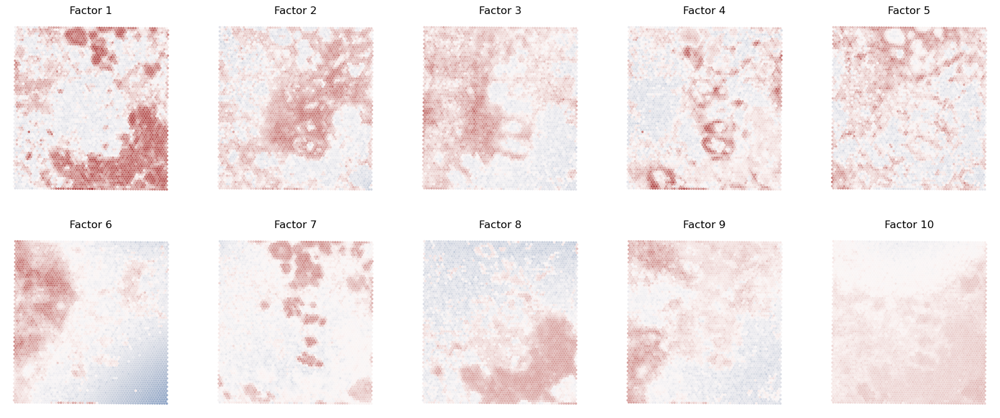

In [15]:
fig, axs = plt.subplots(2, prismo_model_xenium_visium.n_factors // 2, figsize=(20, 8))

vmax = np.abs(z_visium.max())

for i in range(prismo_model_xenium_visium.n_factors):
    ax = axs.flatten()[i]
    ax.scatter(prismo_model_xenium_visium.covariates["visium"][:, 0], prismo_model_xenium_visium.covariates["visium"][:, 1], c=z_visium[:, i], s=3, cmap="vlag", vmax=vmax, vmin=-vmax)
    ax.axis("off")
    ax.set_aspect(1.)
    ax.set_title(f"Factor {i+1}")

In [28]:
w_visium = prismo_model_visium.get_weights("numpy")["view_1"]
w_xenium = prismo_model_xenium.get_weights("numpy")["view_1"]
w_joint = prismo_model_xenium_visium.get_weights("numpy")["rna"]

In [29]:
w_visium.shape

(10, 3000)

In [30]:
w_xenium.shape

(10, 313)

In [24]:
z_visium_single = prismo_model_visium.get_factors("numpy")['group_1']
z_visium_joint = prismo_model_xenium_visium.get_factors("numpy")['visium']

inds, signs = match(z_visium_single, z_visium_joint, dim=-1)

z_visium_joint = z_visium_joint[:, inds] * signs

In [ ]:
z_xenium_single = prismo_model_xenium.get_factors("numpy")['group_1']
z_xenium_joint = prismo_model_xenium_visium.get_factors("numpy")['xenium']